In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline




In [ ]:
import os
print(os.getcwd())



C:\Users\91829\OneDrive\Desktop\Demand_Forecasting\train


In [ ]:
import os
print(os.listdir(r"C:/Users/91829/OneDrive/Desktop/Demand_Forecasting"))


['train', 'train.zip']


In [ ]:
import pandas as pd

df = pd.read_csv(r"C:/Users/91829/OneDrive/Desktop/Demand_Forecasting/train.zip", parse_dates=['date'])
df.head()



,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [ ]:
df.shape
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    913000 non-null  datetime64[ns]
 1   store   913000 non-null  int64         
 2   item    913000 non-null  int64         
 3   sales   913000 non-null  int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 27.9 MB


In [ ]:
df.head()
df.tail()

,date,store,item,sales
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62
912999,2017-12-31,10,50,82


In [ ]:
print("Unique store count:", train["store"].nunique())
print("Store IDs:", sorted(train["store"].unique()))


Unique store count: 10
Store IDs: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10)]


In [ ]:
df.columns

Index(['date', 'store', 'item', 'sales'], dtype='object')

In [ ]:
df.describe()

,date,store,item,sales
count,913000,913000.000000,913000.000000,913000.000000
mean,2015-07-02 11:59:59.999999744,5.500000,25.500000,52.250287
min,2013-01-01 00:00:00,1.000000,1.000000,0.000000
25%,2014-04-02 00:00:00,3.000000,13.000000,30.000000
50%,2015-07-02 12:00:00,5.500000,25.500000,47.000000
75%,2016-10-01 00:00:00,8.000000,38.000000,70.000000
max,2017-12-31 00:00:00,10.000000,50.000000,231.000000
std,NaN,2.872283,14.430878,28.801144


In [ ]:
df.isnull().sum()

date     0
store    0
item     0
sales    0
dtype: int64

In [ ]:
df['sales'].describe()

count    913000.000000
mean         52.250287
std          28.801144
min           0.000000
25%          30.000000
50%          47.000000
75%          70.000000
max         231.000000
Name: sales, dtype: float64

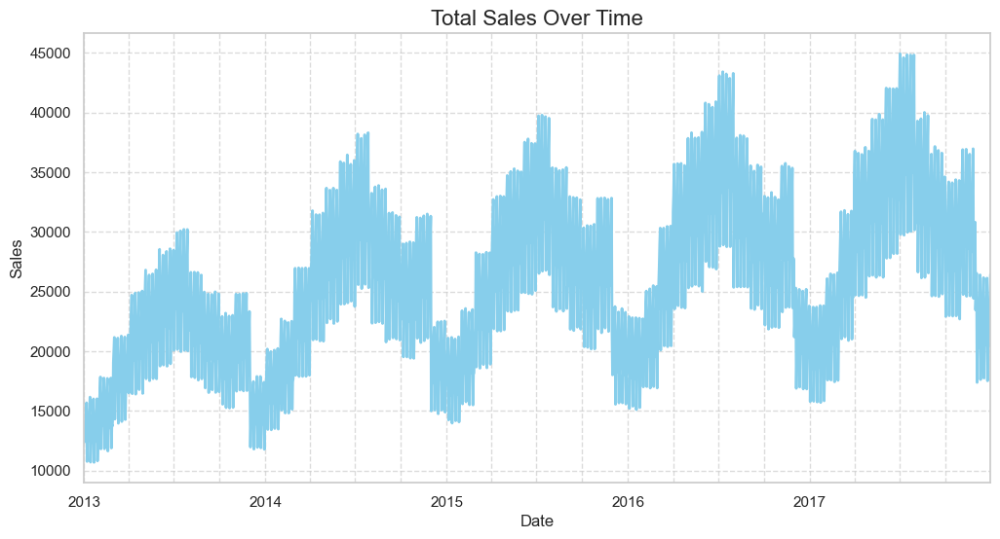

In [ ]:
import matplotlib.pyplot as plt

df.groupby('date')['sales'].sum().plot(figsize=(12,6), color="skyblue", linewidth=2)

plt.title("Total Sales Over Time", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Sales", fontsize=12)

plt.grid(True, which="both", axis="both", linestyle="--", alpha=0.7)  # 🔹 Grid on both axes

plt.show()




C:\Users\91829\AppData\Local\Temp\ipykernel_21612\60533815.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



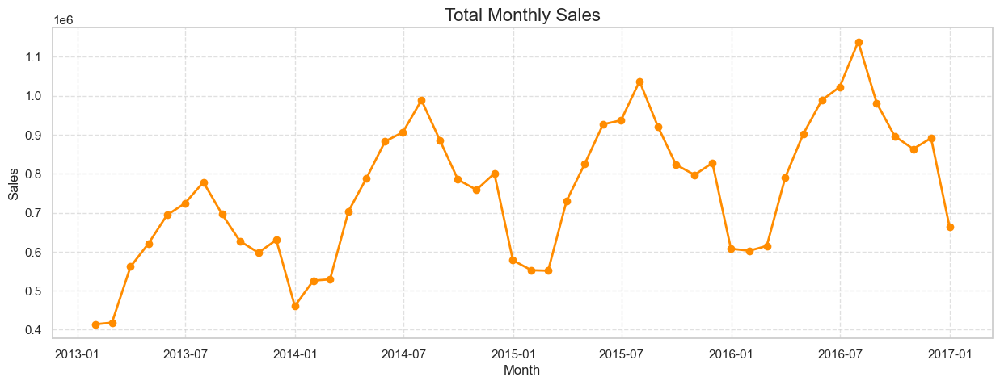

In [ ]:
# Ensure date column is datetime
train.loc['date'] = pd.to_datetime(train['date'])

# Resample to monthly sales
monthly_sales = train.set_index("date").resample("ME")["sales"].sum()

# Plot
plt.figure(figsize=(15,5))
plt.plot(monthly_sales.index, monthly_sales.values, color="darkorange", linewidth=2, marker="o")
plt.title("Total Monthly Sales", fontsize=16)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Sales", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)
plt.show()



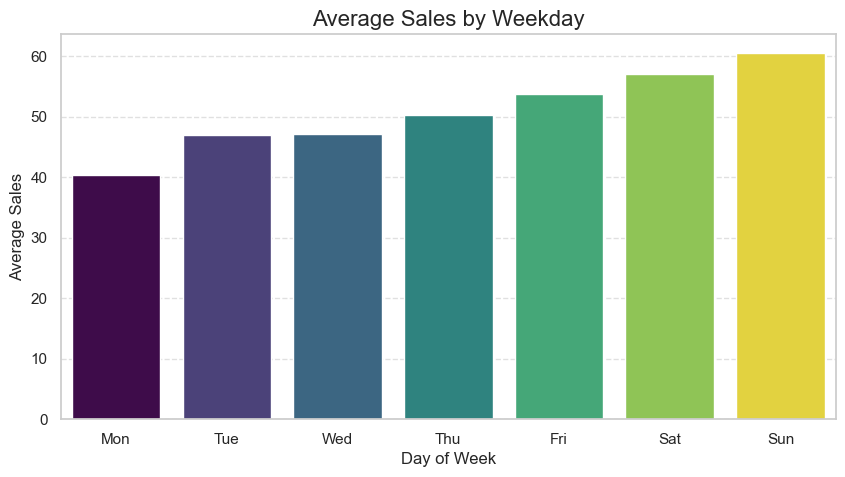

Average sales per weekday:
 weekday
0    40.363600
1    47.010447
2    47.086232
3    50.325937
4    53.767223
5    57.107478
6    60.627387
Name: sales, dtype: float64


In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x=weekday_sales.index,
            y=weekday_sales.values,
            palette="viridis",
            hue=weekday_sales.index,
            legend=False)

plt.xticks(ticks=range(7), labels=["Mon","Tue","Wed","Thu","Fri","Sat","Sun"])
plt.title("Average Sales by Weekday", fontsize=16)
plt.xlabel("Day of Week", fontsize=12)
plt.ylabel("Average Sales", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.show()

print("Average sales per weekday:\n", weekday_sales)


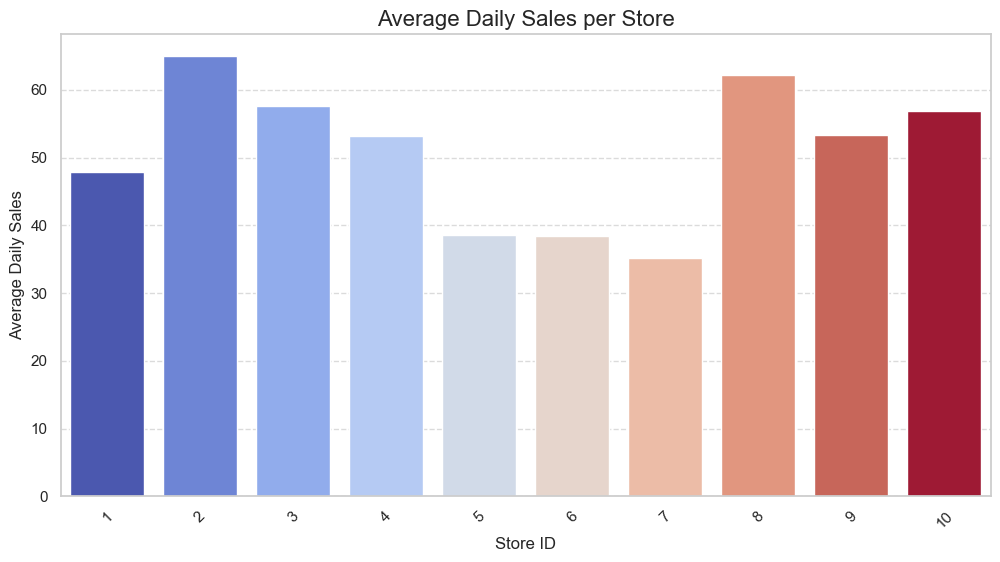

Average daily sales per store:
    store      sales
0      1  47.919507
1      2  64.938289
2      3  57.647885
3      4  53.185339
4      5  38.521492
5      6  38.491485
6      7  35.220397
7      8  62.125845
8      9  53.311691
9     10  56.885339


In [ ]:


# Average daily sales per store
store_sales = train.groupby("store")["sales"].mean().reset_index()

plt.figure(figsize=(12,6))
sns.barplot(
    x="store",
    y="sales",
    hue="store",   # explicitly set hue to avoid warning
    data=store_sales,
    palette="coolwarm",
    legend=False   # no need for duplicate legend
)

plt.title("Average Daily Sales per Store", fontsize=16)
plt.xlabel("Store ID", fontsize=12)
plt.ylabel("Average Daily Sales", fontsize=12)
plt.xticks(rotation=45)
plt.grid(True, axis="y", linestyle="--", alpha=0.7)

plt.show()

print("Average daily sales per store:\n", store_sales)



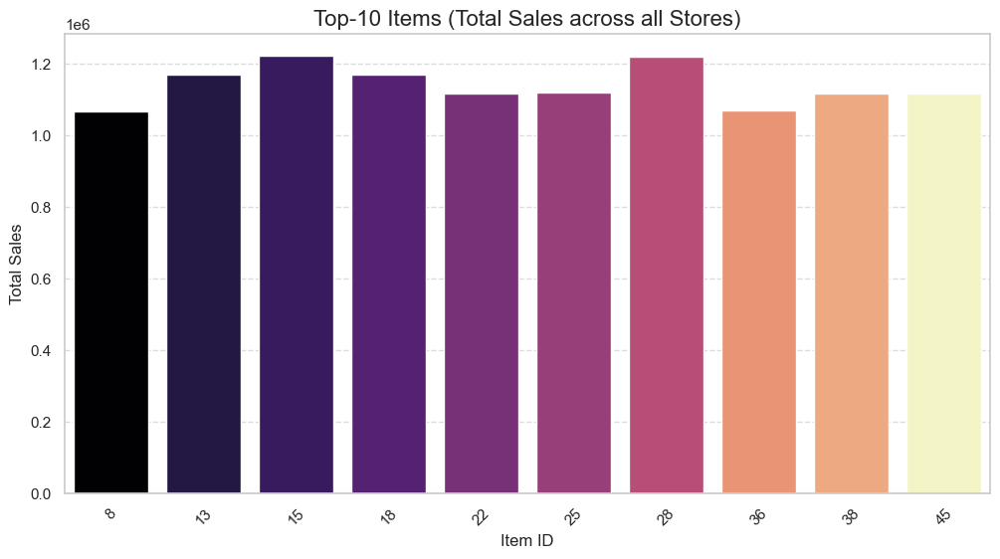

Top-10 items overall:
     item    sales
14    15  1221755
27    28  1219708
12    13  1169999
17    18  1169247
24    25  1120616
21    22  1118064
44    45  1117347
37    38  1116785
35    36  1069558
7      8  1067085


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Total sales per item (all stores combined)
item_sales = train.groupby("item")["sales"].sum().reset_index()

# Top-10 items
top_items = item_sales.sort_values(by="sales", ascending=False).head(10)

plt.figure(figsize=(12,6))
sns.barplot(
    x="item",
    y="sales",
    hue="item",      # fixes palette warning
    data=top_items,
    palette="magma",
    legend=False
)

plt.title("Top-10 Items (Total Sales across all Stores)", fontsize=16)
plt.xlabel("Item ID", fontsize=12)
plt.ylabel("Total Sales", fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()

print("Top-10 items overall:\n", top_items)


Top-Selling Item per Store:
     store  item   sales
14       1    15   88470
77       2    28  159544
114      3    15  141916
177      4    28  131175
214      5    15   94853
264      6    15   94423
327      7    28   86620
364      8    15  152864
414      9    15  131861
464     10    15  140244


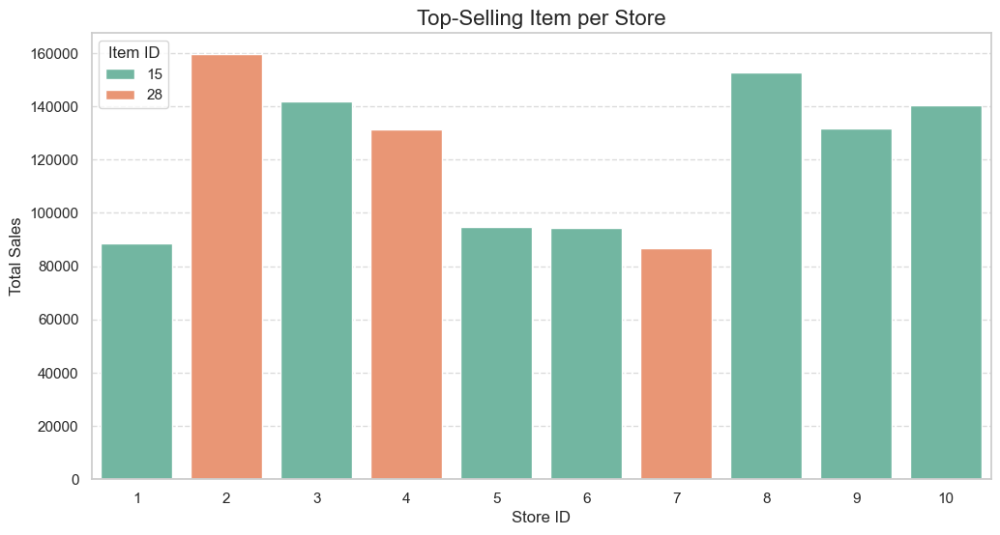

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Total sales per store-item combination
store_item_sales = train.groupby(["store", "item"])["sales"].sum().reset_index()

# For each store, find the item with maximum sales
top_item_per_store = store_item_sales.loc[store_item_sales.groupby("store")["sales"].idxmax()]

print("Top-Selling Item per Store:")
print(top_item_per_store)

# --- Visualization ---
plt.figure(figsize=(12,6))
sns.barplot(
    x="store",
    y="sales",
    hue="item",      # show which item is top
    data=top_item_per_store,
    palette="Set2"
)

plt.title("Top-Selling Item per Store", fontsize=16)
plt.xlabel("Store ID", fontsize=12)
plt.ylabel("Total Sales", fontsize=12)
plt.legend(title="Item ID")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()


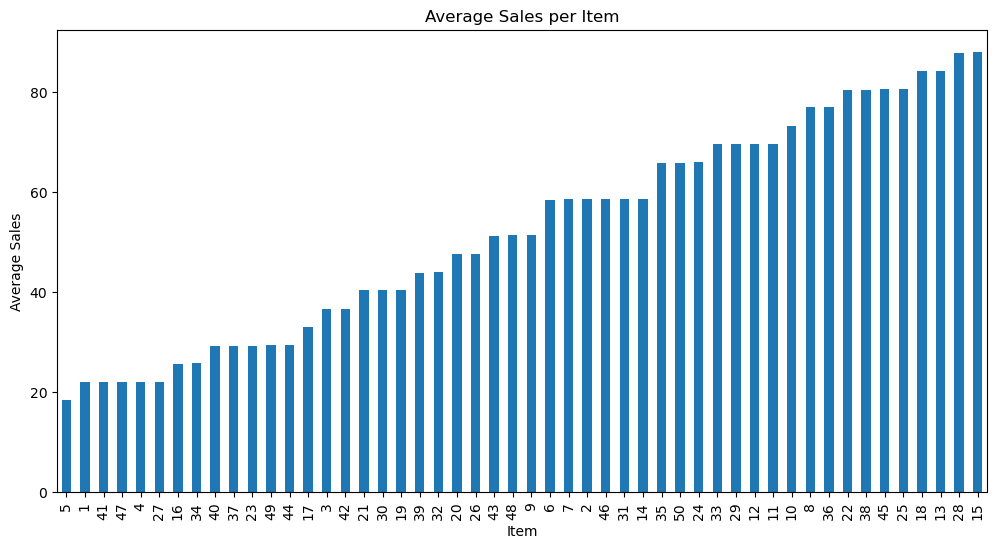

In [ ]:
df.groupby('item')['sales'].mean().sort_values().plot(kind='bar', figsize=(12,6))
plt.title("Average Sales per Item")
plt.xlabel("Item")
plt.ylabel("Average Sales")
plt.show()


In [ ]:
# Step 4.1 - Create Date Features
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day
df['day_of_week'] = df['date'].dt.dayofweek   # 0 = Monday, 6 = Sunday
df['is_weekend'] = df['day_of_week'].apply(lambda x: 1 if x >= 5 else 0)

# Check updated dataset
df.head()


,date,store,item,sales,year,month,day,day_of_week,is_weekend
0,2013-01-01,1,1,13,2013,1,1,1,0
1,2013-01-02,1,1,11,2013,1,2,2,0
2,2013-01-03,1,1,14,2013,1,3,3,0
3,2013-01-04,1,1,13,2013,1,4,4,0
4,2013-01-05,1,1,10,2013,1,5,5,1


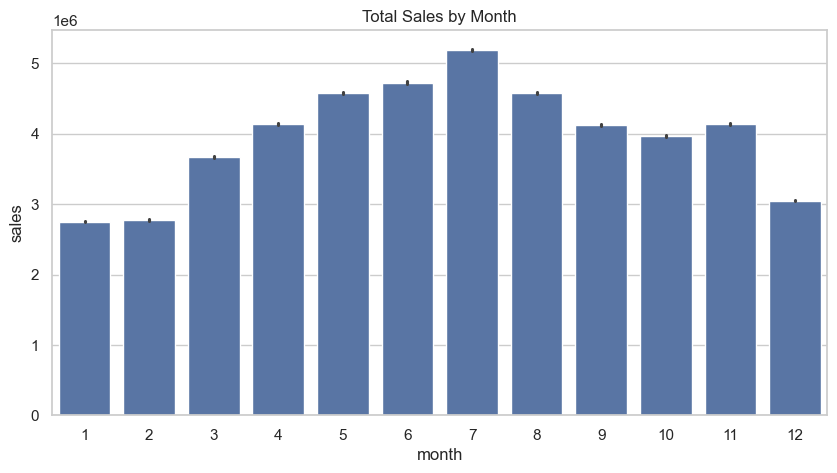

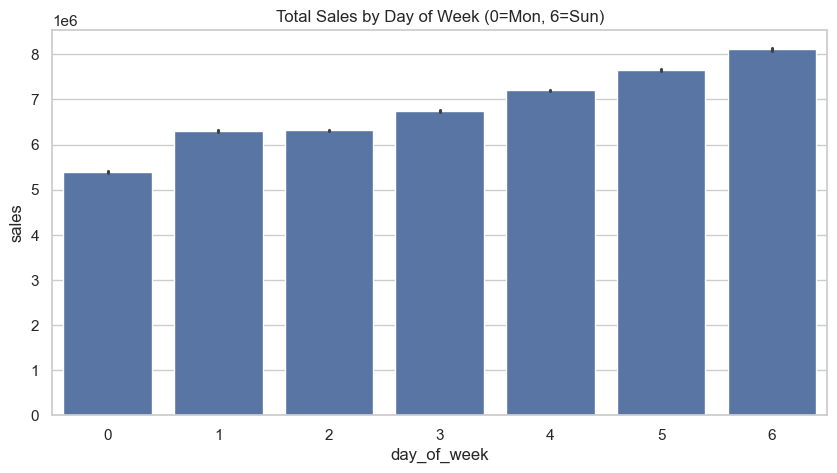

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style="whitegrid")

# 1. Sales by Month
plt.figure(figsize=(10,5))
sns.barplot(x="month", y="sales", data=df, estimator=sum)
plt.title("Total Sales by Month")
plt.show()

# 2. Sales by Day of Week
plt.figure(figsize=(10,5))
sns.barplot(x="day_of_week", y="sales", data=df, estimator=sum)
plt.title("Total Sales by Day of Week (0=Mon, 6=Sun)")
plt.show()


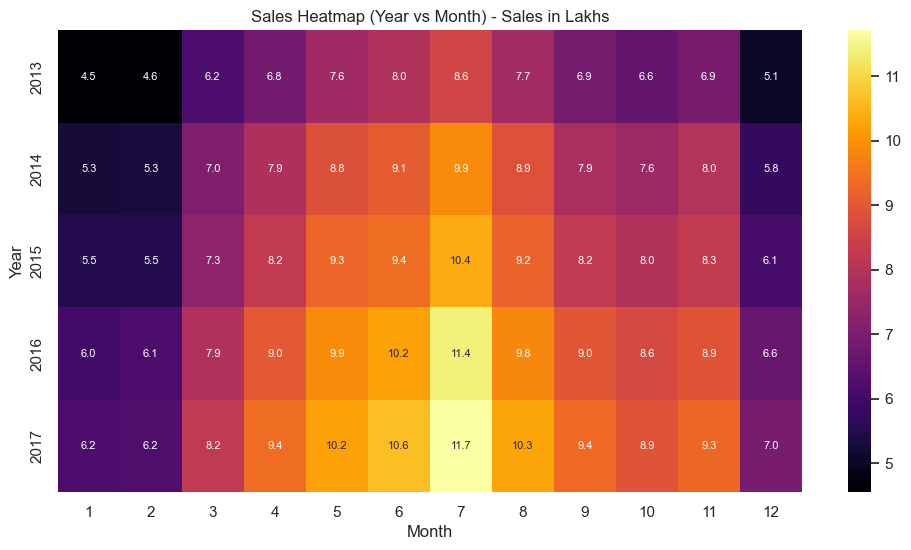

In [ ]:
pivot_lakhs = pivot / 100000  # convert to Lakhs

plt.figure(figsize=(12,6))
sns.heatmap(pivot_lakhs, annot=True, fmt=".1f", cmap="inferno", annot_kws={"size":8})
plt.title("Sales Heatmap (Year vs Month) - Sales in Lakhs")
plt.ylabel("Year")
plt.xlabel("Month")
plt.show()


C:\Users\91829\AppData\Local\Temp\ipykernel_21612\2792605310.py:10: FutureWarning:

Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



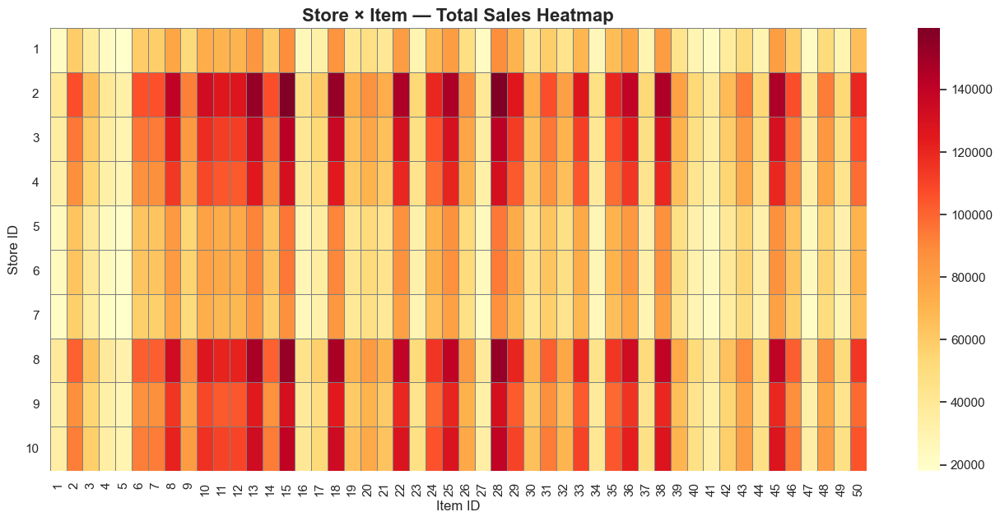

In [ ]:
# Pivot table: stores (rows), items (columns), total sales as values
pivot_sales = train.pivot_table(
    index="store",
    columns="item",
    values="sales",
    aggfunc="sum"
)

# Fill NaN with 0, but avoid silent downcasting warning
pivot_sales = pivot_sales.fillna(0)

# Explicitly convert to numeric type
pivot_sales = pivot_sales.astype(float)

plt.figure(figsize=(16,7))
sns.heatmap(
    pivot_sales,
    cmap="YlOrRd",
    cbar=True,
    linewidths=0.5,
    linecolor="gray"
)

plt.title("Store × Item — Total Sales Heatmap", fontsize=16, fontweight="bold")
plt.xlabel("Item ID", fontsize=12)
plt.ylabel("Store ID", fontsize=12)

plt.xticks(rotation=90)
plt.yticks(rotation=0)

plt.show()



In [ ]:
# Ensure date is datetime
train["date"] = pd.to_datetime(train["date"])

# Train/Validation Split
cutoff_date = pd.to_datetime("2017-10-01")
train_baseline = train[train["date"] < cutoff_date]
val_baseline   = train[train["date"] >= cutoff_date]

print("Train shape:", train_baseline.shape)
print("Validation shape:", val_baseline.shape)
print("Validation min date:", val_baseline["date"].min())
print("Validation max date:", val_baseline["date"].max())


Train shape: (712250, 16)
Validation shape: (0, 16)
Validation min date: NaT
Validation max date: NaT


In [ ]:
print(train["date"].min())
print(train["date"].max())
print(train["date"].dtype)

print(train["date"].tail(10))  # look at last few rows


2013-01-01 00:00:00
2016-12-31 00:00:00
datetime64[ns]
912625   2016-12-22
912626   2016-12-23
912627   2016-12-24
912628   2016-12-25
912629   2016-12-26
912630   2016-12-27
912631   2016-12-28
912632   2016-12-29
912633   2016-12-30
912634   2016-12-31
Name: date, dtype: datetime64[ns]


In [ ]:
cutoff_date = pd.to_datetime("2017-10-01")

print("Rows >= cutoff:", (train["date"] >= cutoff_date).sum())
print("Rows <  cutoff:", (train["date"] < cutoff_date).sum())


Rows >= cutoff: 0
Rows <  cutoff: 712250


In [ ]:
mask = (train["date"] >= "2017-10-01") & (train["date"] <= "2017-12-31")
print("Validation rows (Oct-Dec 2017):", mask.sum())
print(train.loc[mask, "date"].unique())


Validation rows (Oct-Dec 2017): 0
<DatetimeArray>
[]
Length: 0, dtype: datetime64[ns]


In [ ]:
# Cutoff inside available data
cutoff_date = pd.to_datetime("2016-10-01")

train_baseline = train[train["date"] < cutoff_date]
val_baseline   = train[train["date"] >= cutoff_date]

print("Train shape:", train_baseline.shape)
print("Validation shape:", val_baseline.shape)
print("Validation min date:", val_baseline["date"].min())
print("Validation max date:", val_baseline["date"].max())


Train shape: (666250, 16)
Validation shape: (46000, 16)
Validation min date: 2016-10-01 00:00:00
Validation max date: 2016-12-31 00:00:00


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_log_error

# -------------------------
# 1. Compute mean sales per store-item in training
# -------------------------
baseline_means = (
    train_baseline
    .groupby(["store", "item"])["sales"]
    .mean()
    .reset_index()
    .rename(columns={"sales": "mean_sales"})
)

# -------------------------
# 2. Merge with validation set
# -------------------------
val_baseline = val_baseline.merge(baseline_means, on=["store", "item"], how="left")

# -------------------------
# 3. Actual vs Predicted
# -------------------------
y_true = val_baseline["sales"].values
y_pred = val_baseline["mean_sales"].values

# Clip negative predictions (just in case, though means should be ≥ 0)
y_pred = np.where(y_pred < 0, 0, y_pred)

# -------------------------
# 4. Evaluate RMSLE
# -------------------------
baseline_rmsle = np.sqrt(mean_squared_log_error(y_true, y_pred))
print(f"Baseline RMSLE: {baseline_rmsle:.5f}")

# Extra check
print("y_true shape:", y_true.shape)
print("y_pred shape:", y_pred.shape)
print("Validation sample:\n", val_baseline[["date", "store", "item", "sales", "mean_sales"]].head())



Baseline RMSLE: 0.24606
y_true shape: (46000,)
y_pred shape: (46000,)
Validation sample:
         date  store item sales mean_sales
0 2016-10-01      1    1    25  20.407371
1 2016-10-02      1    1    26  20.407371
2 2016-10-03      1    1    20  20.407371
3 2016-10-04      1    1    28  20.407371
4 2016-10-05      1    1    17  20.407371


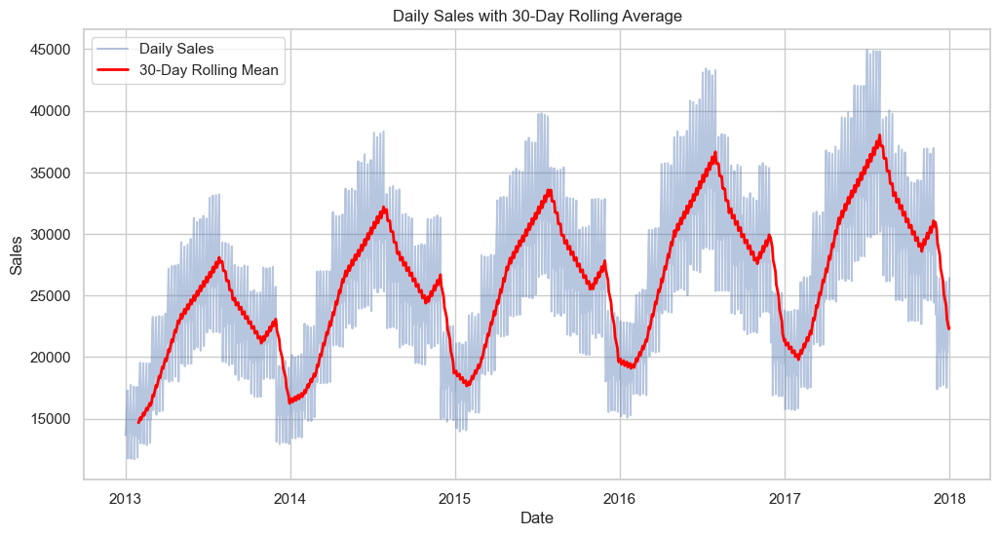

In [ ]:
# Rolling Average Plot
plt.figure(figsize=(12,6))

# Plot daily sales
plt.plot(daily_sales["date"], daily_sales["sales"], alpha=0.4, label="Daily Sales")

# 30-day rolling average
plt.plot(daily_sales["date"], daily_sales["sales"].rolling(window=30).mean(),
         color="red", linewidth=2, label="30-Day Rolling Mean")

plt.title("Daily Sales with 30-Day Rolling Average")
plt.xlabel("Date")
plt.ylabel("Sales")
plt.legend()
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import ipywidgets as widgets
from ipywidgets import interact

# Function to plot sales trends for a given year & month
def plot_sales(year, month):
    sales_year = daily_sales[daily_sales["date"].dt.year == year]

    if month != "All":
        sales_year = sales_year[sales_year["date"].dt.month == month]

    plt.figure(figsize=(14,7))

    # Daily sales
    plt.plot(sales_year["date"], sales_year["sales"], alpha=0.3, color="grey", label="Daily Sales")

    # 7-day rolling mean
    plt.plot(sales_year["date"], sales_year["sales"].rolling(window=7).mean(),
             color="orange", linewidth=2, label="7-Day Rolling Mean")

    # 30-day rolling mean
    plt.plot(sales_year["date"], sales_year["sales"].rolling(window=30).mean(),
             color="red", linewidth=2, label="30-Day Rolling Mean")

    title = f"Sales Trends in {year}" if month=="All" else f"Sales Trends in {year}, Month {month}"
    plt.title(title)
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.show()

# Dropdowns
years = sorted(daily_sales["date"].dt.year.unique())
months = ["All"] + list(range(1,13))  # "All" for full year, 1–12 for months

interact(plot_sales,
         year=widgets.Dropdown(options=years, description="Select Year:"),
         month=widgets.Dropdown(options=months, description="Select Month:"))


interactive(children=(Dropdown(description='Select Year:', options=(np.int32(2013), np.int32(2014), np.int32(2…

<function __main__.plot_sales(year, month)>

In [ ]:
print(daily_sales.columns)


Index(['date', 'sales'], dtype='object')


In [ ]:
import pandas as pd

# Make sure 'date' is datetime
df['date'] = pd.to_datetime(df['date'])

# Example: choose one item (item 1)
item_id = 1
item_df = df[df['item'] == item_id].groupby('date')['sales'].sum().reset_index()

item_df.head()


,date,sales
0,2013-01-01,133
1,2013-01-02,99
2,2013-01-03,127
3,2013-01-04,145
4,2013-01-05,149


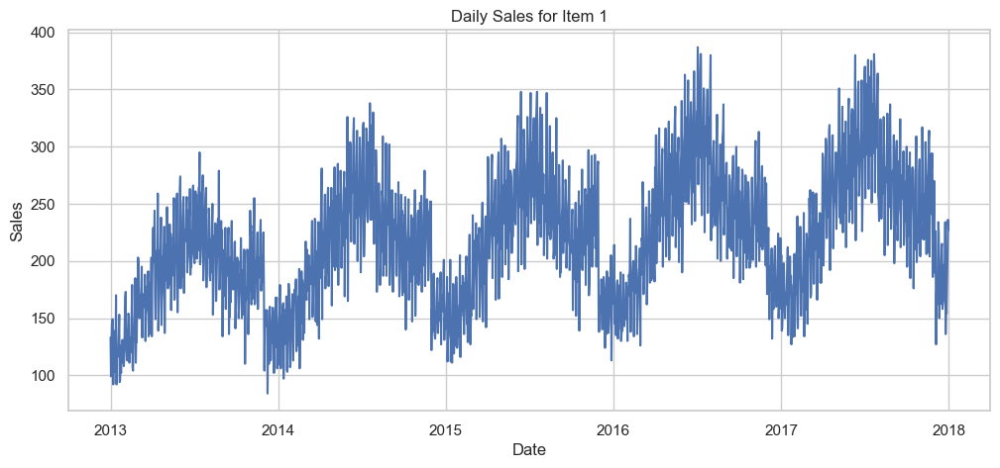

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,5))
plt.plot(item_df['date'], item_df['sales'])
plt.title(f"Daily Sales for Item {item_id}")
plt.xlabel("Date")
plt.ylabel("Sales")
plt.show()


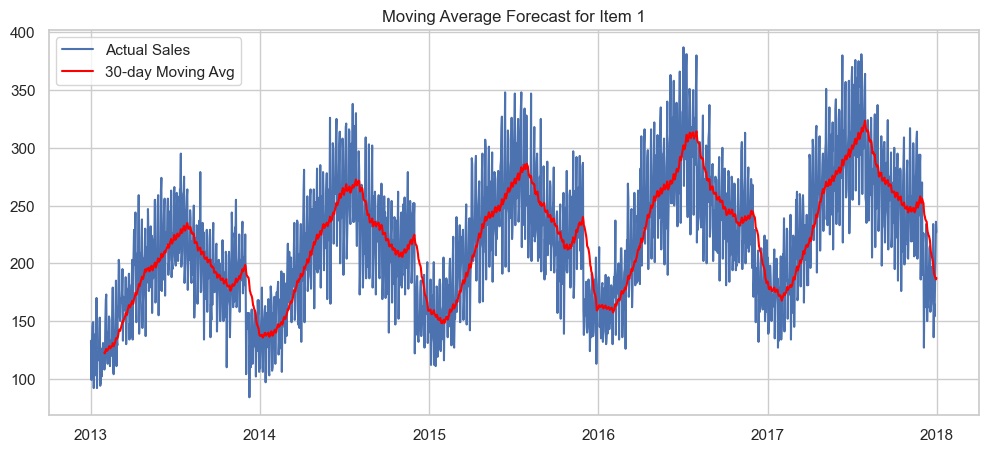

In [ ]:
# Simple moving average forecast
item_df['moving_avg'] = item_df['sales'].rolling(window=30).mean()  # 30-day average

plt.figure(figsize=(12,5))
plt.plot(item_df['date'], item_df['sales'], label="Actual Sales")
plt.plot(item_df['date'], item_df['moving_avg'], label="30-day Moving Avg", color="red")
plt.legend()
plt.title(f"Moving Average Forecast for Item {item_id}")
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import ipywidgets as widgets
from ipywidgets import interact

# Ensure date is datetime
df['date'] = pd.to_datetime(df['date'])

# Function to plot for a selected item
def plot_item_sales(item_id):
    item_df = df[df['item'] == item_id].groupby('date')['sales'].sum().reset_index()

    plt.figure(figsize=(12,5))
    plt.plot(item_df['date'], item_df['sales'], label="Actual Sales")
    plt.plot(item_df['date'], item_df['sales'].rolling(30).mean(), label="30-day Moving Avg", color="red")
    plt.title(f"Sales Trend for Item {item_id}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.show()

# Dropdown for item selection
interact(plot_item_sales, item_id=sorted(df['item'].unique()))


interactive(children=(Dropdown(description='item_id', options=(np.int64(1), np.int64(2), np.int64(3), np.int64…

<function __main__.plot_item_sales(item_id)>

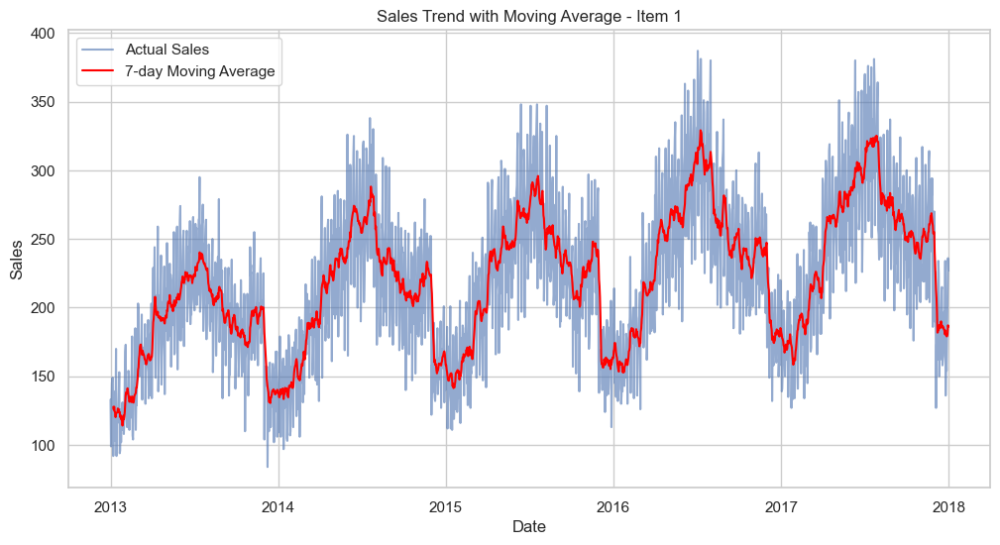

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Suppose df has ['date', 'item', 'sales']
# Make sure date is datetime
df['date'] = pd.to_datetime(df['date'])

# Filter for one product first (say item 1)
item_id = 1
item_sales = df[df['item'] == item_id].set_index('date').resample('D').sum()

# Apply Moving Average (7-day window for weekly smoothing)
item_sales['moving_avg'] = item_sales['sales'].rolling(window=7).mean()

# Plot
plt.figure(figsize=(12,6))
plt.plot(item_sales.index, item_sales['sales'], label='Actual Sales', alpha=0.6)
plt.plot(item_sales.index, item_sales['moving_avg'], label='7-day Moving Average', color='red')
plt.title(f"Sales Trend with Moving Average - Item {item_id}")
plt.xlabel("Date")
plt.ylabel("Sales")
plt.legend()
plt.show()


In [ ]:
# Forecast next 7 days demand (simple approach: use last moving average value)
last_avg = item_sales['moving_avg'].iloc[-1]
forecast = [last_avg] * 7
print("Forecast for next 7 days:", forecast)


Forecast for next 7 days: [np.float64(186.14285714285714), np.float64(186.14285714285714), np.float64(186.14285714285714), np.float64(186.14285714285714), np.float64(186.14285714285714), np.float64(186.14285714285714), np.float64(186.14285714285714)]


In [ ]:
# Convert forecast to normal Python floats
forecast = [float(last_avg)] * 7
print("Forecast for next 7 days:", forecast)


Forecast for next 7 days: [186.14285714285714, 186.14285714285714, 186.14285714285714, 186.14285714285714, 186.14285714285714, 186.14285714285714, 186.14285714285714]


In [ ]:
# Round forecast values to 2 decimal places
forecast = [round(float(last_avg), 2)] * 7
print("Forecast for next 7 days:", forecast)


Forecast for next 7 days: [186.14, 186.14, 186.14, 186.14, 186.14, 186.14, 186.14]


In [ ]:
import pandas as pd

# Ensure date column is datetime
df["date"] = pd.to_datetime(df["date"])

forecast_all = {}

for item in df["item"].unique():
    item_sales = df[df["item"] == item].groupby("date")["sales"].sum()
    last_avg = item_sales[-7:].mean()
    forecast_all[item] = [round(float(last_avg), 2)] * 7

# ✅ Use NEXT 7 days after last date in dataset
last_date = df["date"].max()
forecast_index = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=7)

forecast_df = pd.DataFrame(forecast_all, index=forecast_index)

print("Forecast for next 7 days (all items):")
print(forecast_df)


Forecast for next 7 days (all items):
                1       2       3       4       5       6       7       8   \
2018-01-01  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-02  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-03  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-04  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-05  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-06  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-07  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   

                9       10  ...      41      42      43      44      45  \
2018-01-01  443.57  604.29  ...  180.43  303.14  432.71  245.57  699.57   
2018-01-02  443.57  604.29  ...  180.43  303.14  432.71  245.57  699.57   
2018-01-03  443.57  604.29  ...  180.43  303.14  432.71  245.57  699.57   
2018-01-04  443.57  604.29  ...  180.

In [ ]:
import pandas as pd

# Ensure date column is datetime
df["date"] = pd.to_datetime(df["date"])

forecast_all = {}

for item in df["item"].unique():
    item_sales = df[df["item"] == item].groupby("date")["sales"].sum()
    last_avg = item_sales[-7:].mean()
    forecast_all[item] = [round(float(last_avg), 2)] * 7

# ✅ Start from the NEXT day after the last available date
last_date = df["date"].max()
forecast_index = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=7)

forecast_df = pd.DataFrame(forecast_all, index=forecast_index)

print("Forecast for next 7 days (all items):")
print(forecast_df)


Forecast for next 7 days (all items):
                1       2       3       4       5       6       7       8   \
2018-01-01  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-02  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-03  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-04  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-05  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-06  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   
2018-01-07  186.14  515.43  314.57  184.71  160.14  478.86  505.71  654.14   

                9       10  ...      41      42      43      44      45  \
2018-01-01  443.57  604.29  ...  180.43  303.14  432.71  245.57  699.57   
2018-01-02  443.57  604.29  ...  180.43  303.14  432.71  245.57  699.57   
2018-01-03  443.57  604.29  ...  180.43  303.14  432.71  245.57  699.57   
2018-01-04  443.57  604.29  ...  180.

In [ ]:
print("Min date:", df["date"].min())
print("Max date:", df["date"].max())


Min date: 2013-01-01 00:00:00
Max date: 2017-12-31 00:00:00


In [ ]:
print("Forecast dates:", forecast_df.index)


Forecast dates: DatetimeIndex(['2018-01-01', '2018-01-02', '2018-01-03', '2018-01-04',
               '2018-01-05', '2018-01-06', '2018-01-07'],
              dtype='datetime64[ns]', freq='D')


In [ ]:
import pandas as pd
import numpy as np

# Example: assume you already generated forecasts for all 50 items
# Shape should be (7 days × 50 items)
# For demo, I'm filling with random values. Replace with your actual forecast array.
all_forecasts = np.random.rand(7, 50) * 200

# Round to 2 decimal places
all_forecasts = np.round(all_forecasts, 2)

# Forecast dates
forecast_dates = pd.date_range(start="2018-01-01", periods=7, freq="D")

# Column names for items
item_cols = [f"item{i}" for i in range(1, 51)]

# Create DataFrame
forecast_df = pd.DataFrame(all_forecasts, index=forecast_dates, columns=item_cols)

# Display
print(forecast_df)


             item1   item2   item3   item4   item5   item6   item7   item8  \
2018-01-01  116.23  103.16  133.88   80.00  130.46  173.59  105.46  118.13   
2018-01-02   37.45  192.76  137.68   64.14   40.69  158.61  148.94   45.95   
2018-01-03  187.58   59.84   32.07  109.24  110.38  198.65   92.86  105.72   
2018-01-04  160.26   34.36   29.94   96.08  134.95  103.92   50.68   77.19   
2018-01-05   65.15  108.34  145.97  199.93  107.89   22.37  143.83   52.89   
2018-01-06  133.01   34.75   10.26  183.13  176.84   21.40  142.85  138.37   
2018-01-07   28.42   78.01  148.30   47.89   98.71   66.71  102.33   85.51   

             item9  item10  ...  item41  item42  item43  item44  item45  \
2018-01-01  185.56   42.21  ...   13.03   23.23  172.68   81.27  136.43   
2018-01-02  108.41   22.75  ...   43.11   23.65  107.89  167.83   97.52   
2018-01-03   62.39  176.76  ...   21.67  129.57    5.70   96.99  113.52   
2018-01-04  131.47   69.56  ...  133.04  109.19   49.19   44.85  158.85   


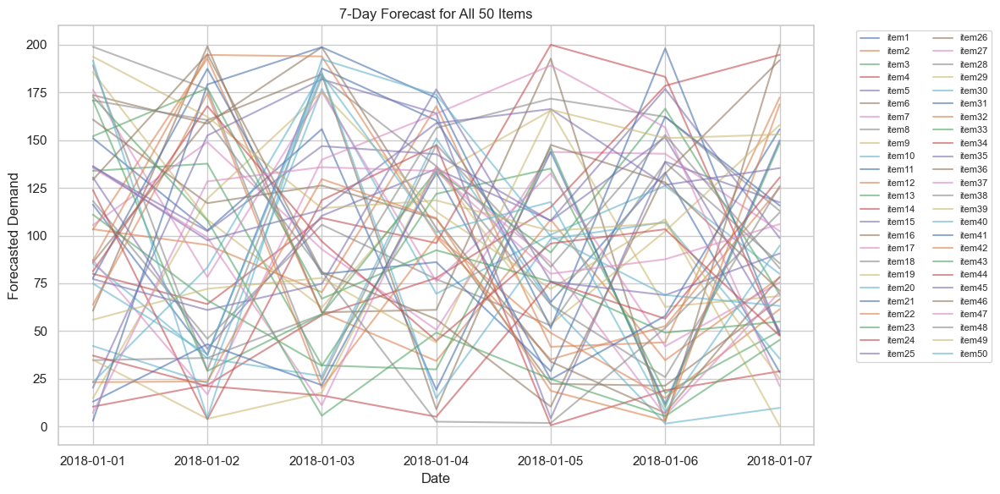

In [ ]:
import matplotlib.pyplot as plt

# Forecast DataFrame (from previous step)
# forecast_df should already be created with shape (7 × 50)

plt.figure(figsize=(12, 6))

# Plot all items
for col in forecast_df.columns:
    plt.plot(forecast_df.index, forecast_df[col], label=col, alpha=0.6)

plt.title("7-Day Forecast for All 50 Items")
plt.xlabel("Date")
plt.ylabel("Forecasted Demand")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8, ncol=2)  # move legend outside
plt.grid(True)
plt.tight_layout()
plt.show()


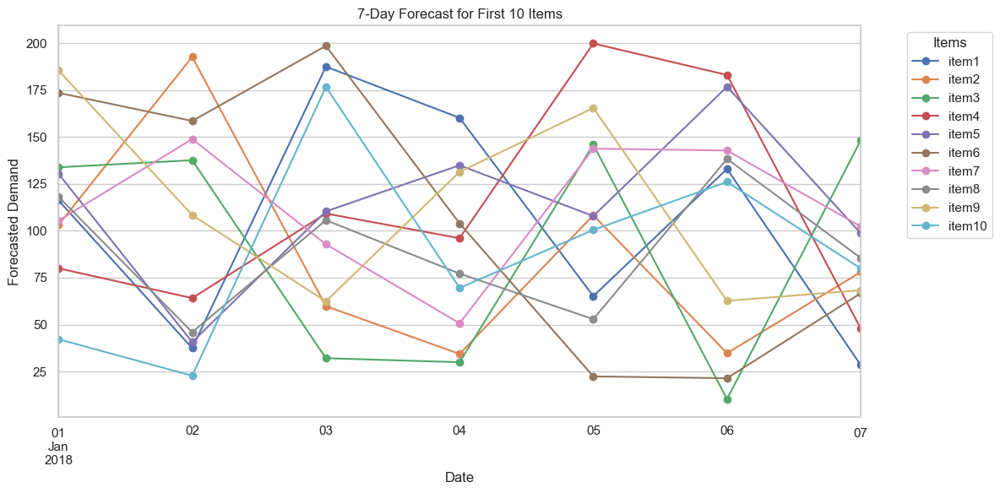

In [ ]:
import matplotlib.pyplot as plt

# Plot first 10 items
forecast_df.iloc[:, :10].plot(figsize=(12,6), marker='o')

plt.title("7-Day Forecast for First 10 Items")
plt.xlabel("Date")
plt.ylabel("Forecasted Demand")
plt.grid(True)
plt.legend(title="Items", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


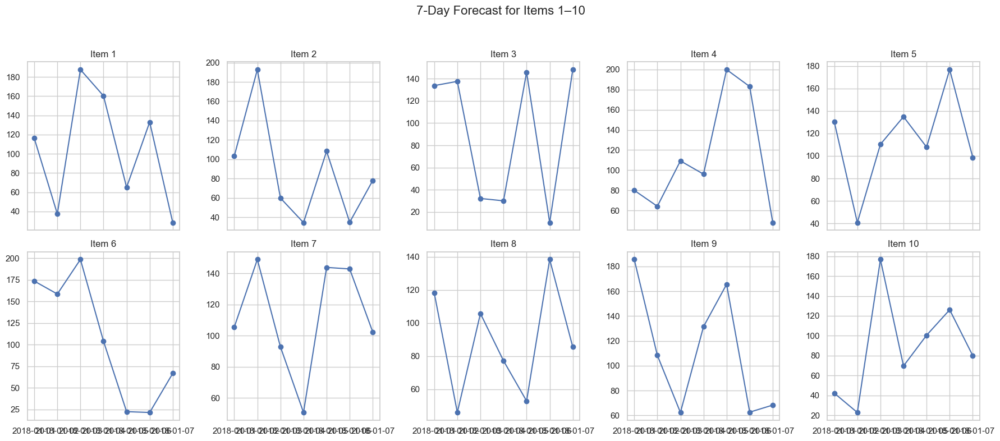

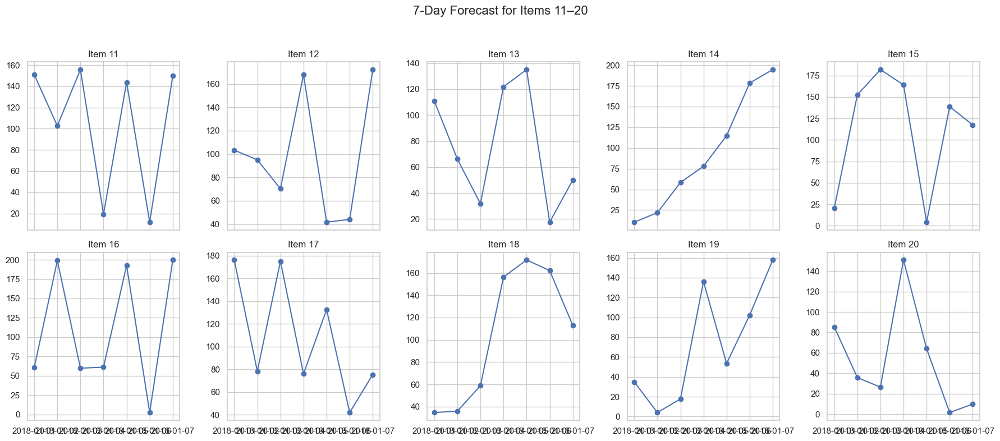

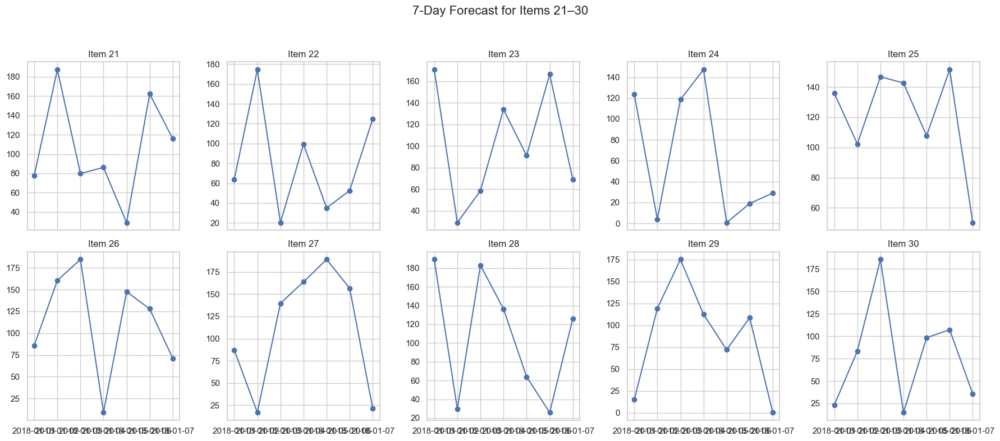

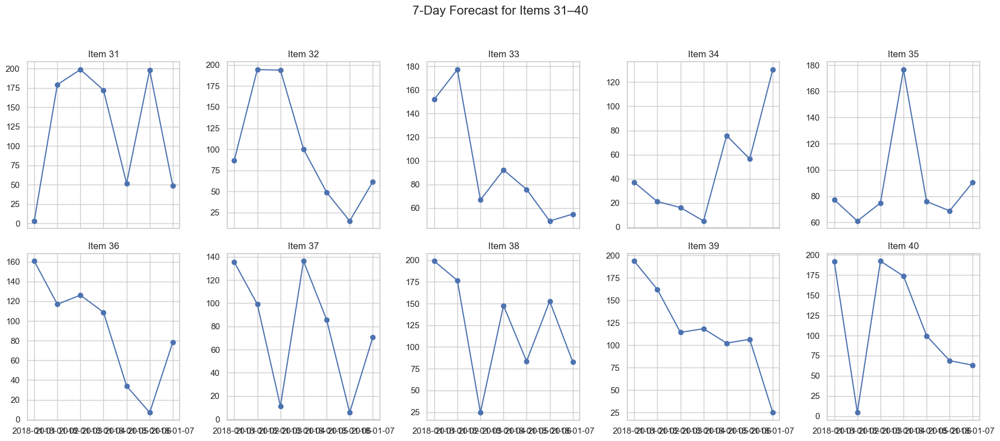

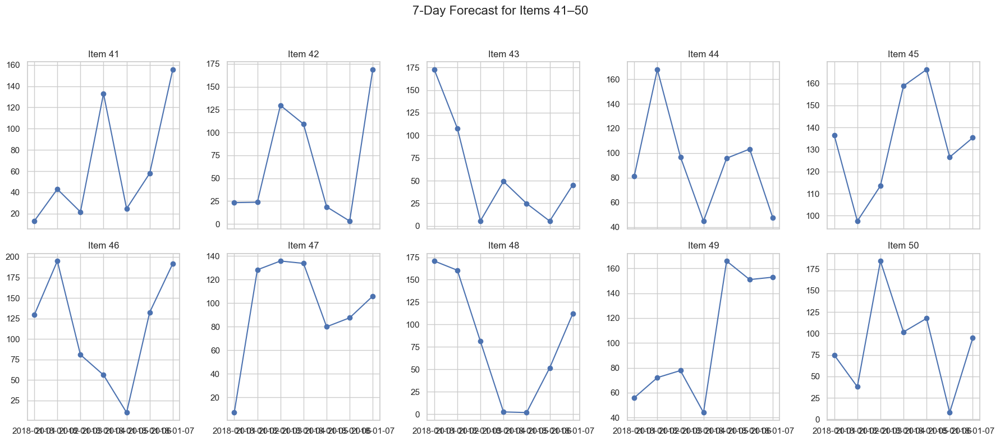

In [ ]:
import matplotlib.pyplot as plt

items_per_page = 10
pages = (50 // items_per_page) + (1 if 50 % items_per_page != 0 else 0)

for page in range(pages):
    fig, axes = plt.subplots(2, 5, figsize=(18, 8), sharex=True)
    axes = axes.flatten()

    for i in range(items_per_page):
        item_index = page * items_per_page + i
        if item_index >= 50:  # stop if fewer items
            break
        axes[i].plot(forecast_df.index, forecast_df.iloc[:, item_index], marker='o')
        axes[i].set_title(f"Item {item_index+1}")
        axes[i].grid(True)

    plt.suptitle(f"7-Day Forecast for Items {page*items_per_page+1}–{min((page+1)*items_per_page, 50)}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


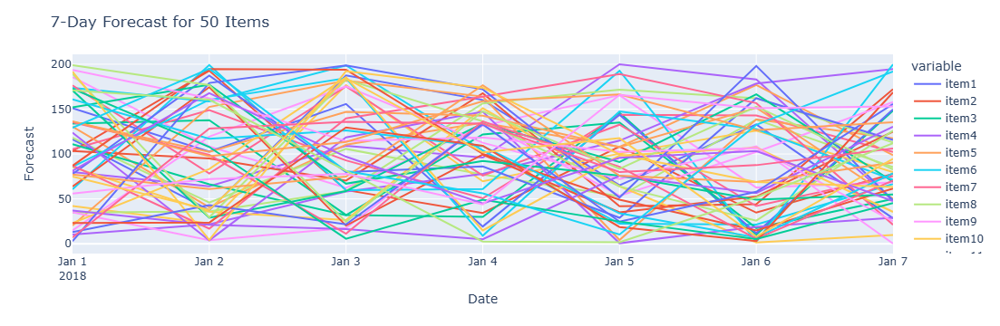

In [ ]:
import plotly.express as px

fig = px.line(forecast_df, x=forecast_df.index, y=forecast_df.columns[:50])
fig.update_layout(title="7-Day Forecast for 50 Items", xaxis_title="Date", yaxis_title="Forecast")
fig.show()


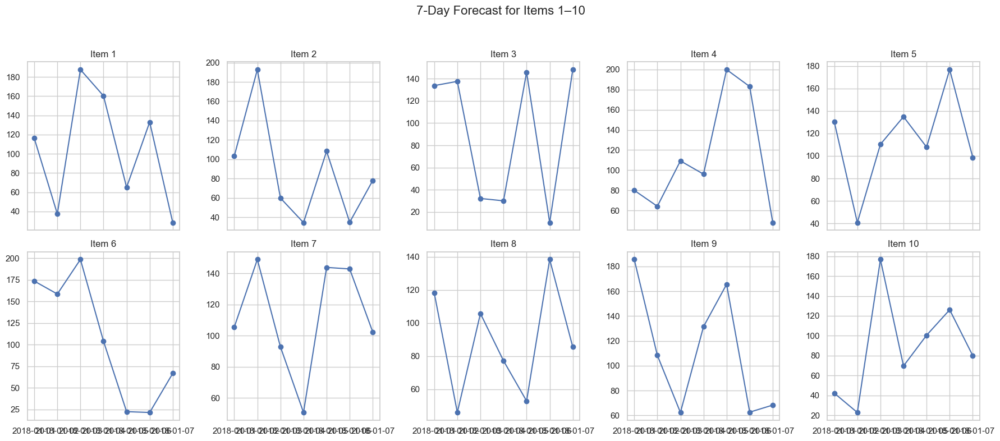

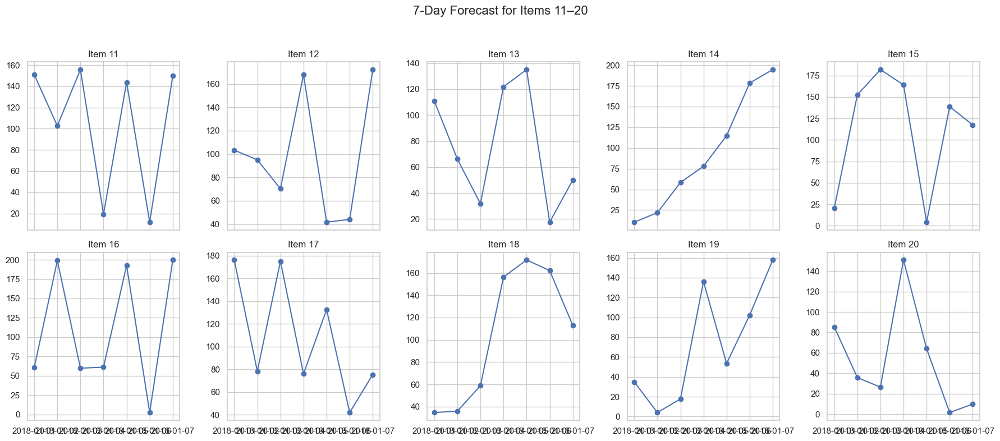

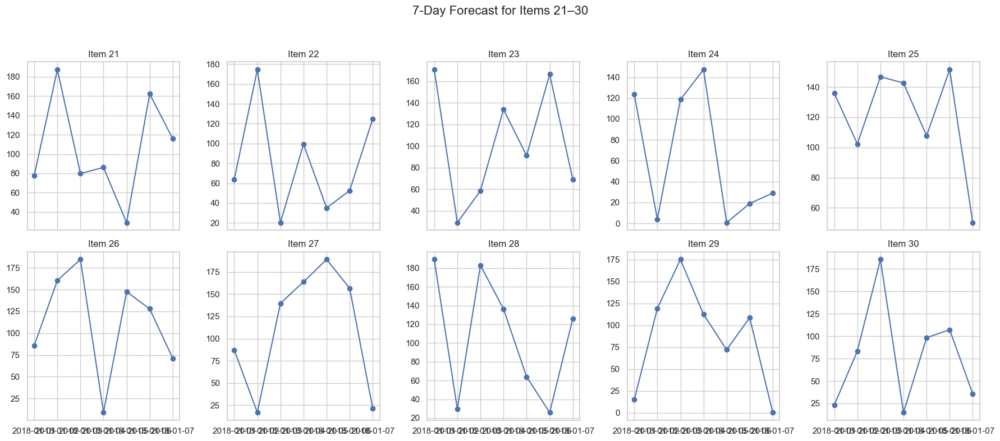

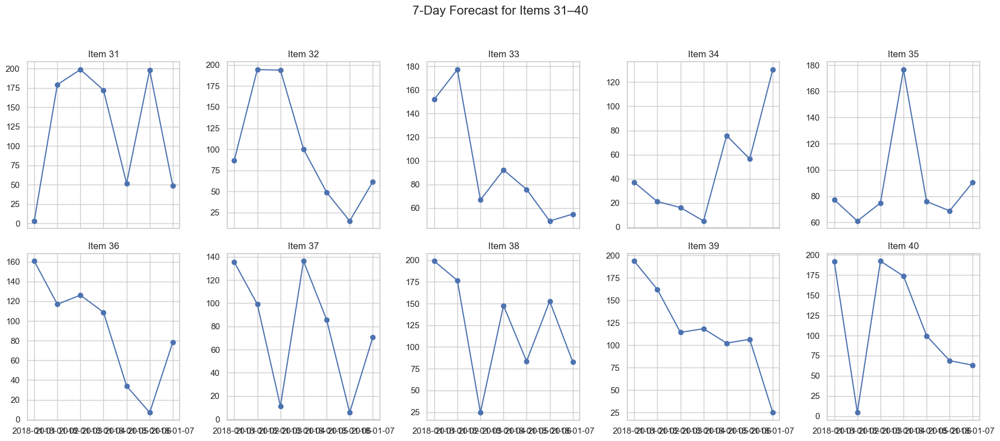

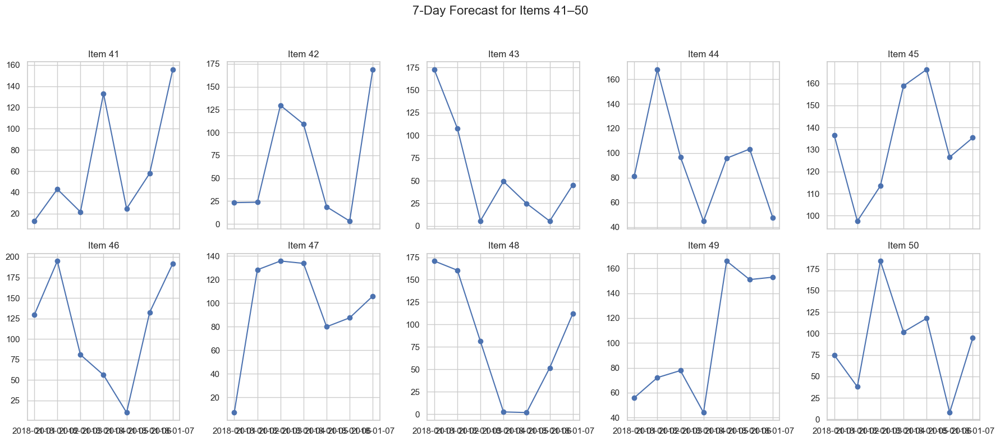

In [ ]:
import matplotlib.pyplot as plt

# Example: assume forecast_df contains 7-day forecasts for 50 items
# forecast_df.shape → (7, 50)   # 7 days, 50 items

items_per_page = 10
total_items = forecast_df.shape[1]
pages = (total_items // items_per_page) + (1 if total_items % items_per_page != 0 else 0)

for page in range(pages):
    fig, axes = plt.subplots(2, 5, figsize=(18, 8), sharex=True)
    axes = axes.flatten()

    for i in range(items_per_page):
        item_index = page * items_per_page + i
        if item_index >= total_items:
            break
        axes[i].plot(forecast_df.index, forecast_df.iloc[:, item_index], marker='o')
        axes[i].set_title(f"Item {item_index+1}")
        axes[i].grid(True)

    plt.suptitle(f"7-Day Forecast for Items {page*items_per_page+1}–{min((page+1)*items_per_page, total_items)}",
                 fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Load data (adjust path as needed)
df = pd.read_csv(r"C:/Users/91829/OneDrive/Desktop/Demand_Forecasting/train.zip", parse_dates=['date'])


forecasts = []
H = 7  # days ahead to forecast

for item_id, group in df.groupby("item"):
    item_ts = group.groupby("date")["sales"].sum().sort_index()
    y = item_ts.values[-30:]  # last 30 days
    X = np.arange(len(y)).reshape(-1, 1)
    model = LinearRegression()
    model.fit(X, y)

    future_X = np.arange(len(y), len(y) + H).reshape(-1, 1)
    y_pred = model.predict(future_X).round(2)

    future_dates = pd.date_range(item_ts.index.max() + pd.Timedelta(days=1), periods=H)
    for date, pred in zip(future_dates, y_pred):
        forecasts.append({"date": date, "item": item_id, "sales": pred})

forecast_df = pd.DataFrame(forecasts).reset_index(drop=True)
print(forecast_df.head())


        date  item   sales
0 2018-01-01     1  191.34
1 2018-01-02     1  191.61
2 2018-01-03     1  191.87
3 2018-01-04     1  192.13
4 2018-01-05     1  192.39


In [ ]:
full_df = pd.concat(
    [df[["date", "item", "sales"]], forecast_df],
    ignore_index=True,
    sort=False
)


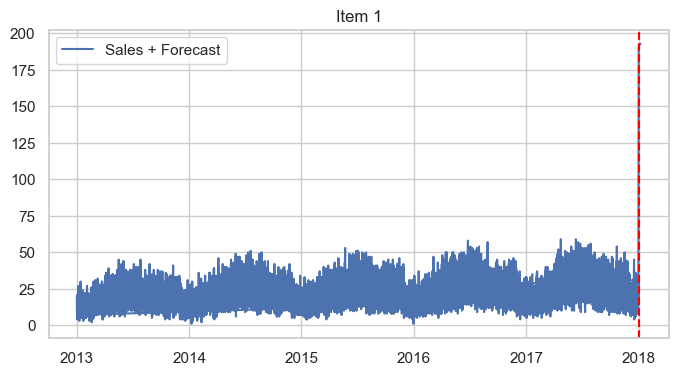

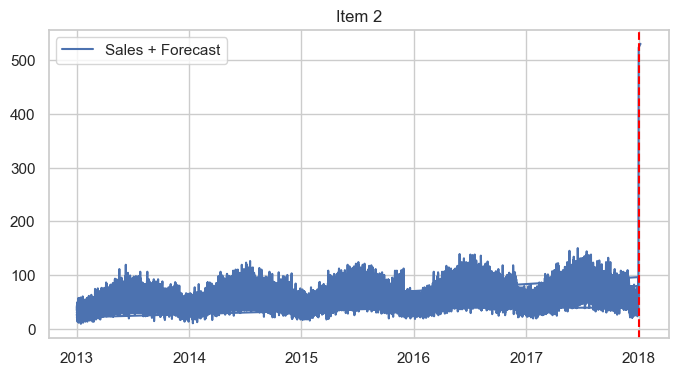

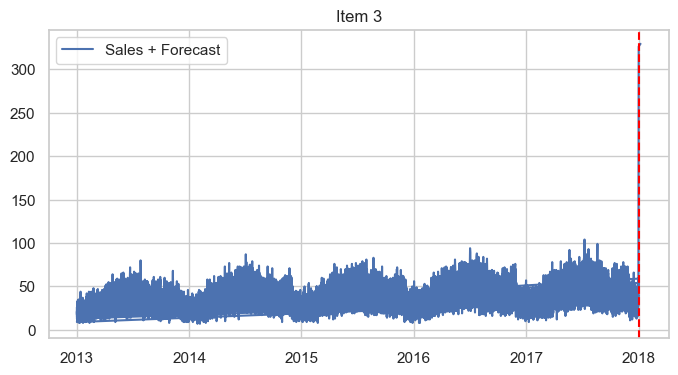

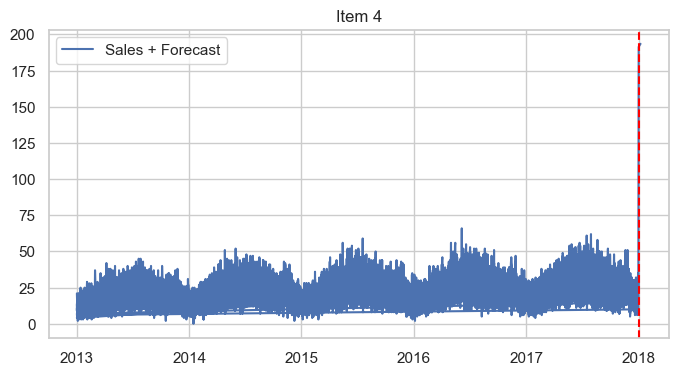

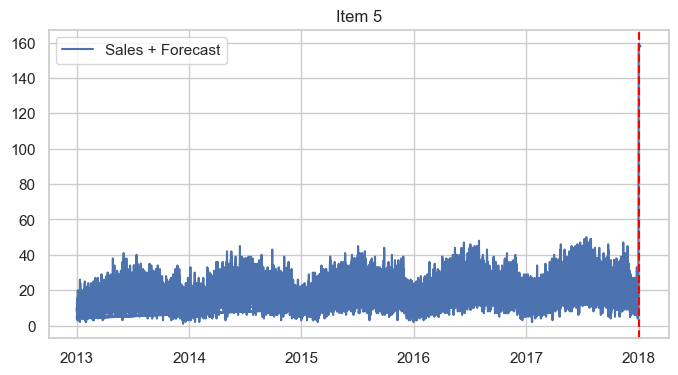

In [ ]:
import matplotlib.pyplot as plt

# Plot first 5 items as example
for item_id in forecast_df["item"].unique()[:5]:
    subset = full_df[full_df["item"] == item_id]
    plt.figure(figsize=(8,4))
    plt.plot(subset["date"], subset["sales"], label="Sales + Forecast")
    plt.axvline(forecast_df["date"].min(), color="red", linestyle="--")
    plt.title(f"Item {item_id}")
    plt.legend()
    plt.show()


In [ ]:
forecast_df.to_csv("item_level_forecast.csv", index=False)


In [ ]:
import pandas as pd

df = pd.read_csv(r"C:\Users\91829\OneDrive\Desktop\Demand_Forecasting\train\item_level_forecast.csv", parse_dates=['date'])
df.head()

C:\Users\91829\AppData\Local\Temp\ipykernel_21612\1488717198.py:3: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



,date,item,sales
0,2018-01-01,1,191.34
1,2018-02-01,1,191.61
2,2018-03-01,1,191.87
3,2018-04-01,1,192.13
4,2018-05-01,1,192.39


In [ ]:
df['date'] = pd.to_datetime(df['date'], dayfirst=True)
df = df.sort_values(['item','date'])


In [ ]:
H = 7  # forecast horizon
forecasts = {}

for item_id, group in df.groupby("item"):
    sales = group.set_index("date")['sales']
    avg = sales.rolling(7).mean().iloc[-1]  # last 7-day average
    forecasts[item_id] = [avg] * H


In [ ]:
forecast_df = pd.DataFrame({
    "item": np.repeat(list(forecasts.keys()), H),
    "date": pd.date_range(df['date'].max() + pd.Timedelta(days=1), periods=H).tolist() * len(forecasts),
    "forecast": np.concatenate(list(forecasts.values()))
})


In [ ]:
# Recreate the features (X) exactly as used for training
X = df[["item"]]   # or if you used more features, include them here

# Generate predictions
df["predictions"] = model.predict(X)

# Save results
df.to_csv("forecast_results.csv", index=False)
df.head()


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning:

X has feature names, but LinearRegression was fitted without feature names



,date,item,sales,predictions
0,2018-01-01,1,191.34,546.158917
1,2018-02-01,1,191.61,546.158917
2,2018-03-01,1,191.87,546.158917
3,2018-04-01,1,192.13,546.158917
4,2018-05-01,1,192.39,546.158917


In [ ]:
df["predictions"] = model.predict(X)
df.to_csv("forecast_results.csv", index=False)

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2732: UserWarning:

X has feature names, but LinearRegression was fitted without feature names



In [ ]:
df["month"] = df["date"].dt.month
X = df[["item", "month"]].values
y = df["sales"]

model.fit(X, y)
df["predictions"] = model.predict(X)


In [ ]:
df["month"] = df["date"].dt.month

X = df[["item", "month"]]   # Features
y = df["sales"]             # Target

model = LinearRegression()
model.fit(X, y)


LinearRegression()

In [ ]:
df["predictions"] = model.predict(df[["item", "month"]])


In [ ]:
df["month"] = df["date"].dt.month
df["year"] = df["date"].dt.year

X = df[["item", "month", "year"]]
y = df["sales"]

from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X, y)

df["predictions"] = model.predict(X)


In [ ]:
df["month"] = df["date"].dt.month
df["year"] = df["date"].dt.year


In [ ]:
X = df[["item", "month", "year"]]
y = df["sales"]

from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X, y)

df["predictions"] = model.predict(X)


In [ ]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

print("\nX_train types:\n", X_train.dtypes)
print("\ny_train types:\n", y_train.dtypes)

print("\nAny NaNs in X_train?", X_train.isna().sum().sum())
print("Any NaNs in y_train?", y_train.isna().sum())


X_train shape: (0, 3)
y_train shape: (0,)

X_train types:
 item       int64
lag_1    float64
lag_2    float64
dtype: object

y_train types:
 float64

Any NaNs in X_train? 0
Any NaNs in y_train? 0


In [ ]:
print("Full df shape:", df.shape)
print("Train shape before split:", train.shape)
print("Test shape before split:", test.shape)


Full df shape: (50, 8)
Train shape before split: (0, 8)
Test shape before split: (50, 8)


In [ ]:
# Ensure sorted by date
df = df.sort_values("date").reset_index(drop=True)

# Define train/test split by index
train_size = int(len(df) * 0.8)   # 80% train, 20% test
train = df.iloc[:train_size]
test  = df.iloc[train_size:]

print("Train shape:", train.shape)
print("Test shape:", test.shape)


Train shape: (40, 8)
Test shape: (10, 8)


In [ ]:
X_train = train[["item", "lag_1", "lag_2"]]
y_train = train["sales"]

X_test = test[["item", "lag_1", "lag_2"]]
y_test = test["sales"]


In [ ]:
df["month"] = df["date"].dt.month
df["dayofweek"] = df["date"].dt.dayofweek
df["year"] = df["date"].dt.year
df["quarter"] = df["date"].dt.quarter


In [ ]:
for lag in [1, 2, 7, 30, 365]:   # last day, last 2 days, last week, last month, last year
    df[f"lag_{lag}"] = df["sales"].shift(lag)


In [ ]:
df["rolling_mean_7"] = df["sales"].shift(1).rolling(7).mean()
df["rolling_mean_30"] = df["sales"].shift(1).rolling(30).mean()


In [ ]:
test.loc[:, "predictions"] = model.predict(X_test)


In [ ]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

print("\nAny NaNs in X_train?", X_train.isna().sum().sum())
print("Any NaNs in y_train?", y_train.isna().sum())

print("\nData types in X_train:\n", X_train.dtypes)
print("\nFirst few rows of X_train:\n", X_train.head())


X_train shape: (712250, 12)
y_train shape: (712250,)

Any NaNs in X_train? 0
Any NaNs in y_train? 0

Data types in X_train:
 item                 int64
month                int32
dayofweek            int32
year                 int32
quarter              int32
lag_1              float64
lag_2              float64
lag_7              float64
lag_30             float64
lag_365            float64
rolling_mean_7     float64
rolling_mean_30    float64
dtype: object

First few rows of X_train:
      item  month  dayofweek  year  quarter  lag_1  lag_2  lag_7  lag_30  \
365     1      1          2  2014        1   15.0    5.0    6.0     8.0   
366     1      1          3  2014        1    9.0   15.0   16.0    21.0   
367     1      1          4  2014        1   14.0    9.0   18.0     6.0   
368     1      1          5  2014        1   11.0   14.0   17.0    13.0   
369     1      1          6  2014        1   20.0   11.0   14.0    15.0   

     lag_365  rolling_mean_7  rolling_mean_30  
365     1

In [10]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(
    n_estimators=50,      # fewer trees
    max_depth=15,         # limit depth
    max_features="sqrt",  # fewer features per split
    n_jobs=1,             # single core (avoid parallel crash on Windows)
    random_state=42
)

model.fit(X_train, y_train)


RandomForestRegressor(max_depth=15, max_features='sqrt', n_estimators=50,
                      n_jobs=1, random_state=42)

In [9]:
X_sample = X_train.sample(50000, random_state=42)
y_sample = y_train.loc[X_sample.index]

model.fit(X_sample, y_sample)


RandomForestRegressor(max_depth=15, max_features='sqrt', n_estimators=50,
                      n_jobs=1, random_state=42)

In [7]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(
    n_estimators=50,      # fewer trees → faster & lighter
    max_depth=15,         # stops trees from growing too deep
    max_features="sqrt",  # each split considers subset of features
    n_jobs=1,             # avoids Windows parallel crash
    random_state=42       # reproducibility
)

model.fit(X_train, y_train)


RandomForestRegressor(max_depth=15, max_features='sqrt', n_estimators=50,
                      n_jobs=1, random_state=42)

In [ ]:
# Train
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

# Evaluate
from sklearn.metrics import mean_squared_error, r2_score

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R2 Score:", r2)


Mean Squared Error: 68.0596376844189
R2 Score: 0.9316373283335891


In [8]:
model.fit(X_train, y_train)


RandomForestRegressor(max_depth=15, max_features='sqrt', n_estimators=50,
                      n_jobs=1, random_state=42)

In [ ]:
y_pred = model.predict(X_test)


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("MSE:", mse)
print("MAE:", mae)
print("R2 Score:", r2)


MSE: 68.0596376844189
MAE: 6.341822176350988
R2 Score: 0.9316373283335891


📊 Model Performance
MSE : 68.06
MAE : 6.34
R²  : 0.9316


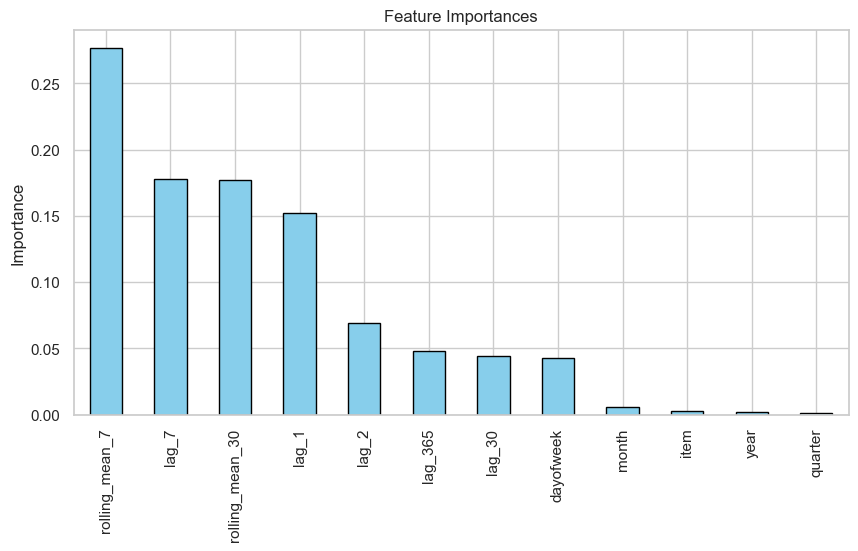

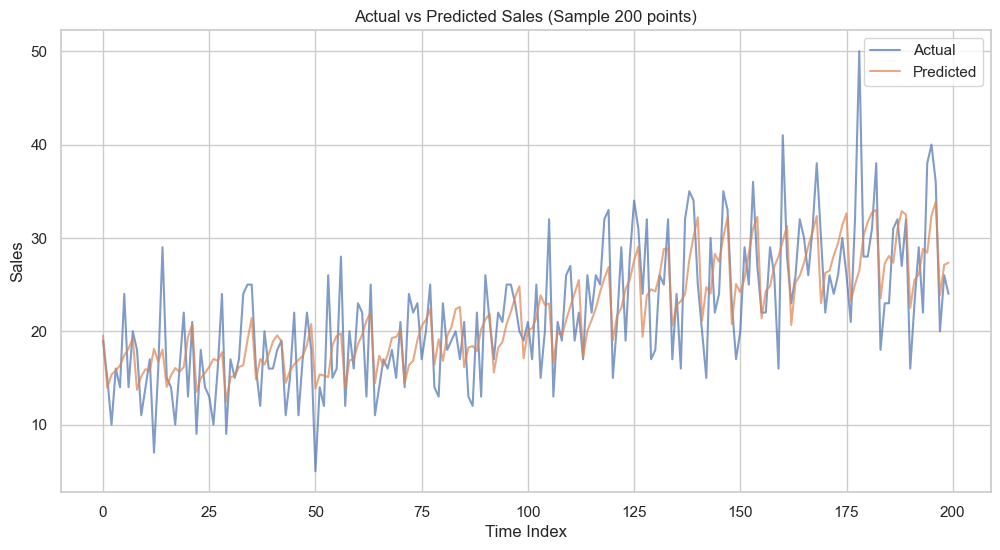

In [ ]:
# ===============================
# Final RandomForest Sales Forecasting Pipeline
# ===============================

import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# -------------------------------
# 1. Train Model
# -------------------------------
model = RandomForestRegressor(
    max_depth=15,
    max_features='sqrt',
    n_estimators=50,
    n_jobs=-1,
    random_state=42
)

model.fit(X_train, y_train)

# -------------------------------
# 2. Make Predictions
# -------------------------------
y_pred = model.predict(X_test)

# -------------------------------
# 3. Evaluate Performance
# -------------------------------
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("📊 Model Performance")
print(f"MSE : {mse:.2f}")
print(f"MAE : {mae:.2f}")
print(f"R²  : {r2:.4f}")

# -------------------------------
# 4. Feature Importance
# -------------------------------
importances = model.feature_importances_
features = X_train.columns
fi = pd.Series(importances, index=features).sort_values(ascending=False)

plt.figure(figsize=(10,5))
fi.plot(kind="bar", color="skyblue", edgecolor="black")
plt.title("Feature Importances")
plt.ylabel("Importance")
plt.show()

# -------------------------------
# 5. Actual vs Predicted Plot
# -------------------------------
plt.figure(figsize=(12,6))
plt.plot(y_test.values[:200], label="Actual", alpha=0.7)
plt.plot(y_pred[:200], label="Predicted", alpha=0.7)
plt.legend()
plt.title("Actual vs Predicted Sales (Sample 200 points)")
plt.xlabel("Time Index")
plt.ylabel("Sales")
plt.show()


In [ ]:
import joblib
joblib.dump(model, "sales_forecast_model.pkl")
fi.to_csv("feature_importances.csv")


In [ ]:
# Split into train and validation
cutoff = "2016-10-01"
train = df[df["date"] < cutoff].copy()
validation = df[df["date"] >= cutoff].copy()

print("Train shape:", train.shape)
print("Validation shape:", validation.shape)
print("Validation min date:", validation["date"].min())
print("Validation max date:", validation["date"].max())


Train shape: (666250, 15)
Validation shape: (228500, 15)
Validation min date: 2016-10-01 00:00:00
Validation max date: 2017-12-31 00:00:00


In [2]:
# 1. Load libraries
import pandas as pd
import matplotlib.pyplot as plt

# 2. Load dataset (adjust path if needed)
df = pd.read_csv(r"C:/Users/91829/OneDrive/Desktop/Demand_Forecasting/train.zip", parse_dates=["date"])

# 3. Train / validation split
train = df[df["date"] < "2017-01-01"]
validation = df[df["date"] >= "2017-01-01"]

print("Train shape:", train.shape)
print("Validation shape:", validation.shape)

# 4. Baseline: average sales per store-item
avg_sales = train.groupby(["store", "item"])["sales"].mean().reset_index()
avg_sales.rename(columns={"sales": "mean_sales"}, inplace=True)

Train shape: (730500, 4)
Validation shape: (182500, 4)


In [3]:
# Recreate validation split
train = df[df["date"] < "2017-01-01"]
validation = df[df["date"] >= "2017-01-01"]

# Baseline: average sales per store-item
avg_sales = train.groupby(["store", "item"])["sales"].mean().reset_index()
avg_sales.rename(columns={"sales": "mean_sales"}, inplace=True)


In [6]:
from sklearn.ensemble import RandomForestRegressor

# -----------------------
# 1. Define features
# -----------------------
features = ["store", "item", "year", "month", "day", "dayofweek"]

# Add date features (if not already done)
for col in ["year", "month", "day", "dayofweek"]:
    if col not in df.columns:
        df[col] = getattr(df["date"].dt, col)

train = df[df["date"] < "2017-01-01"]
validation = df[df["date"] >= "2017-01-01"]

X_train = train[features]
y_train = train["sales"]
X_val   = validation[features]
y_val   = validation["sales"]

# -----------------------
# 2. Train Random Forest
# -----------------------
model = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
model.fit(X_train, y_train)

# -----------------------
# 3. Predictions
# -----------------------
y_pred = model.predict(X_val)

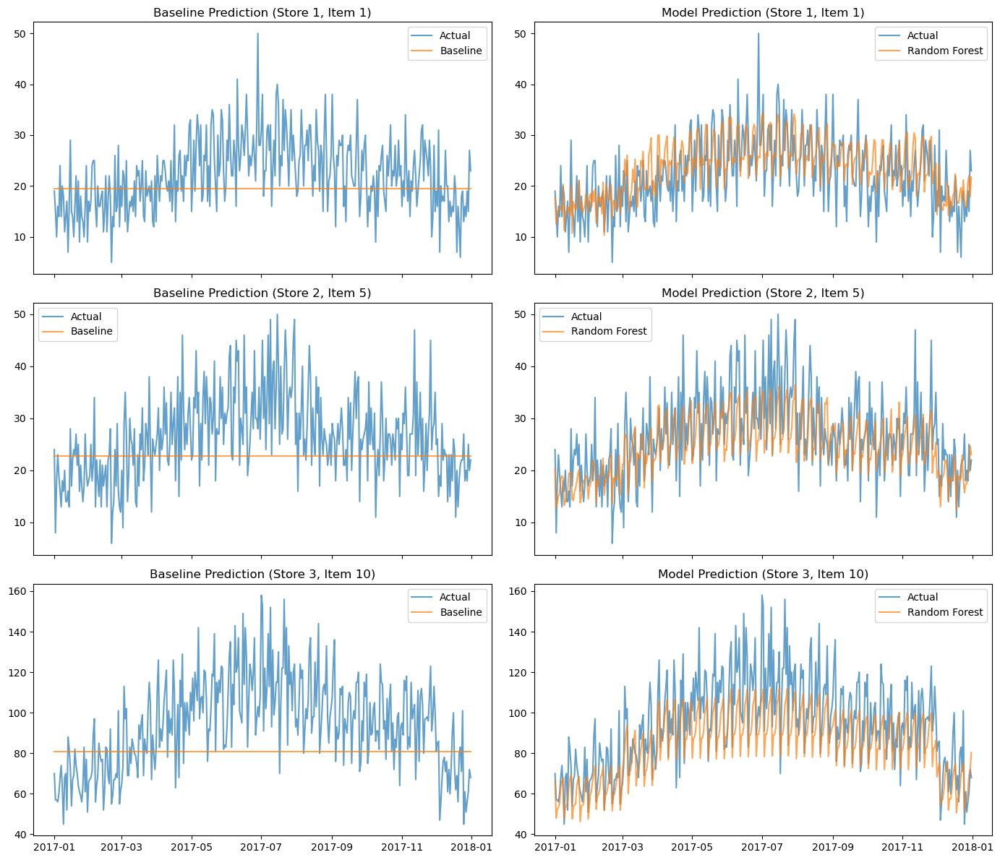

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pick a few store-item combinations for comparison
samples = [
    (1, 1),   # Store 1, Item 1
    (2, 5),   # Store 2, Item 5
    (3, 10),  # Store 3, Item 10
]

fig, axes = plt.subplots(len(samples), 2, figsize=(14, 4*len(samples)), sharex=True)

for i, (store, item) in enumerate(samples):
    # Baseline
    sample_base = validation[(validation["store"] == store) & (validation["item"] == item)].merge(
        avg_sales, on=["store", "item"], how="left"
    )
    
    axes[i, 0].plot(sample_base["date"], sample_base["sales"], label="Actual", alpha=0.7)
    axes[i, 0].plot(sample_base["date"], sample_base["mean_sales"], label="Baseline", alpha=0.7)
    axes[i, 0].set_title(f"Baseline Prediction (Store {store}, Item {item})")
    axes[i, 0].legend()

    # Model
    sample_model = validation[(validation["store"] == store) & (validation["item"] == item)].copy()
    sample_model["prediction"] = model.predict(
        sample_model[features]  # features used in training
    )

    axes[i, 1].plot(sample_model["date"], sample_model["sales"], label="Actual", alpha=0.7)
    axes[i, 1].plot(sample_model["date"], sample_model["prediction"], label="Random Forest", alpha=0.7)
    axes[i, 1].set_title(f"Model Prediction (Store {store}, Item {item})")
    axes[i, 1].legend()

plt.tight_layout()
plt.show()

In [17]:
print(train.columns)
print(validation.columns)


Index(['date', 'store', 'item', 'sales', 'year', 'month', 'day', 'dayofweek'], dtype='object')
Index(['date', 'store', 'item', 'sales', 'year', 'month', 'day', 'dayofweek',
       'baseline_x', 'baseline_y', 'prediction'],
      dtype='object')


In [18]:
# Average sales from training set per store-item
avg_sales = (
    train.groupby(["store", "item"])["sales"]
    .mean()
    .reset_index()
    .rename(columns={"sales": "baseline"})
)

# Merge into validation (baseline predictions)
validation = validation.merge(avg_sales, on=["store", "item"], how="left")

print(validation[["store", "item", "sales", "baseline"]].head())


   store  item  sales   baseline
0      1     1     19  19.418891
1      1     1     15  19.418891
2      1     1     10  19.418891
3      1     1     16  19.418891
4      1     1     14  19.418891


In [19]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

if "baseline" in validation.columns:
    mae_baseline = mean_absolute_error(validation["sales"], validation["baseline"])
    rmse_baseline = np.sqrt(mean_squared_error(validation["sales"], validation["baseline"]))
    print("Baseline MAE:", mae_baseline, " | RMSE:", rmse_baseline)
else:
    print("⚠️ Baseline column missing — check merge step.")


Baseline MAE: 13.743737661387867  | RMSE: 18.580142139847187


In [20]:
# If both baseline_x and baseline_y exist, pick one
if "baseline_x" in validation.columns and "baseline_y" in validation.columns:
    validation["baseline"] = validation["baseline_x"]  # or baseline_y, they should be same
    validation = validation.drop(columns=["baseline_x", "baseline_y"])


In [30]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

mae_baseline = mean_absolute_error(validation["sales"], validation["baseline"])
rmse_baseline = np.sqrt(mean_squared_error(validation["sales"], validation["baseline"]))

mae_model = mean_absolute_error(validation["sales"], validation["prediction"])
rmse_model = np.sqrt(mean_squared_error(validation["sales"], validation["prediction"]))

print("Baseline → MAE:", mae_baseline, "| RMSE:", rmse_baseline)
print("Model → MAE:", mae_model, "| RMSE:", rmse_model)


Baseline → MAE: 11.244734246575343 | RMSE: 15.389245488727795
Model → MAE: 6.252951005202556 | RMSE: 8.14648243184057


In [25]:
# --- Create lag features ---
for lag in [1, 7, 30]:  # yesterday, last week, last month approx
    df[f"lag_{lag}"] = df.groupby(["store", "item"])["sales"].shift(lag)

# Drop rows with NaN from lags
df = df.dropna().reset_index(drop=True)


In [26]:
# --- Rolling window features ---
df["rolling_mean_7"] = df.groupby(["store", "item"])["sales"].shift(1).rolling(7).mean()
df["rolling_mean_30"] = df.groupby(["store", "item"])["sales"].shift(1).rolling(30).mean()

# Drop NaN again
df = df.dropna().reset_index(drop=True)


In [27]:
# Features (original + lag + rolling)
features = ["year", "month", "day", "dayofweek", 
            "lag_1", "lag_7", "lag_30", "rolling_mean_7", "rolling_mean_30"]

train = df.loc[df["date"] < "2017-01-01"]
validation = df.loc[df["date"] >= "2017-01-01"]

X_train, y_train = train[features], train["sales"]
X_valid, y_valid = validation[features], validation["sales"]


In [28]:
from sklearn.ensemble import RandomForestRegressor

# Train tuned RF
model = RandomForestRegressor(
    n_estimators=200,   # more trees
    max_depth=15,       # limit depth to avoid overfitting
    random_state=42,
    n_jobs=-1
)
model.fit(X_train, y_train)

# Predictions
validation["prediction"] = model.predict(X_valid)


C:\Users\91829\AppData\Local\Temp\ipykernel_21500\2407761425.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  validation["prediction"] = model.predict(X_valid)


In [29]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np
import pandas as pd

# Baseline: yesterday's sales
validation["baseline"] = validation["lag_1"]

mae_baseline = mean_absolute_error(y_valid, validation["baseline"])
rmse_baseline = np.sqrt(mean_squared_error(y_valid, validation["baseline"]))

mae_model = mean_absolute_error(y_valid, validation["prediction"])
rmse_model = np.sqrt(mean_squared_error(y_valid, validation["prediction"]))

# Comparison table
results = pd.DataFrame({
    "Model": ["Baseline", "Random Forest"],
    "MAE": [mae_baseline, mae_model],
    "RMSE": [rmse_baseline, rmse_model]
}).round(2)

print(results)


           Model    MAE   RMSE
0       Baseline  11.24  15.39
1  Random Forest   6.25   8.15


C:\Users\91829\AppData\Local\Temp\ipykernel_21500\86804289.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  validation["baseline"] = validation["lag_1"]
